# Importing modules

In [14]:
# ===================================================================
# Libraries for Plotting and Visualization
# ===================================================================
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import matplotlib.patches as mpatches
from matplotlib.ticker import FormatStrFormatter
import seaborn as sns

# ===================================================================
# Data Handling and Utilities
# ===================================================================
import pandas as pd
import numpy as np

# ===================================================================
# Machine Learning Models and Preprocessing
# ===================================================================
# Classifiers
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Cross-validation and Model Selection
from sklearn.model_selection import *

# Scaling and Preprocessing
from sklearn.preprocessing import *

# Metrics for Evaluation
from sklearn.metrics import *

# ===================================================================
# Outlier Detection Models
# ===================================================================
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM

# ===================================================================
# Dimensionality Reduction
# ===================================================================
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# ===================================================================
# Clustering and Other Utilities
# ===================================================================
from scipy.cluster import hierarchy


# Setting the working directory to the current folder

In [15]:
import os

# Get the current notebook's directory
current_dir = os.path.dirname(os.path.abspath(__file__)) if '__file__' in globals() else os.getcwd()

# Change the working directory to the notebook's directory
os.chdir(current_dir)

# Confirm the working directory has been changed
print(f"Working directory set to: {os.getcwd()}")


Working directory set to: c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes


# Function for Plotting  Dendrograms for better modularity based on scipy.cluster.hierarchy

In [16]:
# Import necessary libraries for clustering and hierarchical dendrogram plotting
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
import numpy as np

# Function to generate a dendrogram based on the AgglomerativeClustering model
def dendrogram_GPA(model, **kwargs):
    """
    Generates a hierarchical dendrogram from an AgglomerativeClustering model.
    
    Arguments:
        model: Fitted AgglomerativeClustering model.
        **kwargs: Additional arguments to be passed to the dendrogram function.

    Returns:
        d: Dendrogram object.
    """
    
    # Initialize counts array to store the sample counts under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)

    # Calculate the sample counts under each node by iterating through the merges
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # Leaf node: directly counts as 1
                current_count += 1  
            else:
                # Non-leaf node: aggregate counts from child nodes
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # Create the linkage matrix, which includes the child nodes, distances, and counts
    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    # Plot the dendrogram using the linkage matrix and any additional arguments passed
    d = dendrogram(linkage_matrix, link_color_func=lambda x: color[x], **kwargs)

    return d

# Function to perform Agglomerative Clustering and plot the dendrogram
def plot_dendrogram(**kwargs):
    """
    Performs Agglomerative Clustering and plots the dendrogram for the first few levels.
    
    Arguments:
        **kwargs: Additional arguments to be passed to the dendrogram_GPA function.
    
    Returns:
        d: Dendrogram object.
    """
    
    # Setting distance_threshold=0 ensures that we compute the full tree without pruning
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
    
    # Use the GPA data for clustering
    X = prpca.GPApt
    
    # Fit the AgglomerativeClustering model to the data
    model = model.fit(X)
    
    # Plot the top levels of the dendrogram using the "truncate_mode" parameter
    d = dendrogram_GPA(model, **kwargs, truncate_mode="level")

    return d


# Functions for evaluationg the performance of all the classifiers at once

In [17]:
from sklearn.model_selection import StratifiedKFold
import numpy as np

def evalc(i, clf):
    """
    Evaluates a classifier using Stratified K-fold Cross Validation.
    
    Args:
    i (int): Index for dataset choice (used to determine which dataset to use for training).
    clf: Classifier to be evaluated.
    
    Returns:
    yt: True labels across all splits.
    yp: Predicted labels across all splits.
    x_axis_labels: Labels for x-axis.
    """
    
    # Initialize StratifiedKFold for 5-fold cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []  # To store true labels across all splits
    yp = []  # To store predicted labels across all splits
    
    # Loop over each fold in the cross-validation process
    for train, test in cv.split(Xs, y):
        
        # Create mask to filter out specific labels in the training set
        mask = np.ones(len(y[train]), dtype=bool)
        
        # Remove certain labels from training set
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False
        
        # Select the appropriate feature set and train the classifier
        if i < 7:
            clf.fit(Xs[train][mask], encoder.transform(y[train][mask]))
        elif i == 7:
            clf.fit(X3[train][mask], encoder.transform(y[train][mask]))
        else:
            clf.fit(X10[train][mask], encoder.transform(y[train][mask]))
        
        # Create mask to filter out specific labels in the test set
        mask = np.ones(len(y[test]), dtype=bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False
        
        # Make predictions using the trained classifier
        if i < 7:
            pred = encoder.inverse_transform(clf.predict(Xs[test][mask]))
        elif i == 7:
            pred = encoder.inverse_transform(clf.predict(X3[test][mask]))
        else:
            pred = encoder.inverse_transform(clf.predict(X10[test][mask]))
        
        # Append true labels and predicted labels
        yt.append(y[test][mask])
        yp.append(pred)
    
    # Concatenate the true labels and predicted labels from all splits
    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    # Axis labels for the confusion matrix plot
    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    return yt, yp, x_axis_labels


In [18]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def eval():
    """
    Evaluates a set of classifiers using Stratified K-fold Cross Validation.
    
    Returns:
    yt: True labels across all classifiers.
    yp: Predicted labels across all classifiers.
    xl: Axis labels for the confusion matrix plot.
    """
    
    # Define the classifiers to evaluate
    KNNc = KNeighborsClassifier(n_neighbors=2)
    LRc = LogisticRegression(C=100, penalty='l1', solver='saga')
    kernel = 1.0 * RBF(1.0)
    model = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPc = GaussianProcessClassifier(kernel=kernel, random_state=0)
    SVc = SVC(gamma='auto', C=100, kernel='linear')
    RFc = RandomForestClassifier(max_depth=5, n_estimators=50)
    ETc = ExtraTreesClassifier(max_depth=9, n_estimators=100)
    XGBc = XGBClassifier(max_depth=3, n_estimators=50)
    lda3 = LinearDiscriminantAnalysis(n_components=2)
    lda10 = LinearDiscriminantAnalysis(n_components=2)
    
    models = [KNNc, LRc, GPc, SVc, RFc, ETc, XGBc, lda3, lda10]
    
    yt = []  # True labels across all classifiers
    yp = []  # Predicted labels across all classifiers
    xl = []  # Axis labels for the confusion matrix
    
    # Loop over each classifier and evaluate
    for i, h in enumerate(models):
        ytt, ypt, x_axis_labels = evalc(i, h)
        yt.append(ytt)
        yp.append(ypt)
        xl.append(x_axis_labels)
    
    return yt, yp, xl


# Function to Add arrows to a Matplotlib axis

In [19]:
import matplotlib.patches as mpatches
import numpy as np

def addarrow(ind, ind1, ind2, ax, rotate=0):
    """
    Adds an arrow to a Matplotlib axis, from a point in the dataset to another point.
    The arrow can be optionally rotated.

    Parameters:
    ind (int): Index of the data point to start the arrow.
    ind1 (int): Column index for the x-coordinate in the dataset.
    ind2 (int): Column index for the y-coordinate in the dataset.
    ax (matplotlib.axes.Axes): The axis object where the arrow will be drawn.
    rotate (float, optional): Angle in degrees to rotate the arrow. Default is 0 (no rotation).
    """
    
    # Decrease ind1 and ind2 by 1 to adjust for 1-based indexing
    ind1 -= 1
    ind2 -= 1

    # Get the axis limits to calculate step sizes
    start, end = ax.get_xlim()
    stepx = (end - start) / 10  # Step size for x-axis
    start, end = ax.get_ylim()
    stepy = (end - start) / 10  # Step size for y-axis

    # Get the dataset from prpca
    x = prpca.x

    # Calculate the initial position of the arrow
    xt = x[ind, ind1] - stepx
    yt = x[ind, ind2] + stepy

    # If a rotation angle is provided, rotate the arrow
    if rotate != 0:
        # Convert the rotation angle from degrees to radians
        rotate = rotate * (np.pi) / 180

        # Calculate the sine and cosine of the rotation angle
        s = np.sin(rotate)
        c = np.cos(rotate)

        # Calculate the new coordinates after rotation
        xt -= x[ind, ind1]
        yt -= x[ind, ind2]
        xnew = xt * c - yt * s
        ynew = xt * s + yt * c

        # Apply the rotation to get the final position
        xt = xnew + x[ind, ind1]
        yt = ynew + x[ind, ind2]

    # Create and add the arrow patch to the plot
    arrow = mpatches.FancyArrowPatch((xt, yt), (x[ind, ind1], x[ind, ind2]),
                                     color='red', edgecolor='black', mutation_scale=10)
    ax.add_patch(arrow)


# Preprations

In [20]:
# Importing MORPHIX
from Morphometrics_3 import procpca as procpca

In [21]:
# Creating a dataframe that will include the species names and encoded values and their gender information
# Open the 'names.txt' file to read the species names
f = open('names.txt', 'r')
names = []
for line in f:
    names.append(line[:-1])  # Remove the newline character at the end of each line
f.close()  # Close the file after reading

# Process the species names to remove extra spaces
nc = []
for i in names:
    a = i.replace(' ', '')  # Remove any spaces from the species name
    nc.append(a)

# Initialize an empty list to store the group (species) labels
gr = []

# Iterate through the species names and assign corresponding group labels
for i in names:
    # print(i)  # Print the current species name for debugging
    if 'papio cynocephalus' in i:
        gr.append('papio cynocephalus')  # Group label for 'papio cynocephalus'
    elif 'mandrillus leucophaeus' in i:
        gr.append('mandrillus leucophaeus')  # Group label for 'mandrillus leucophaeus'
    elif 'Macaca mulatta' in i:
        gr.append('Macaca mulatta')  # Group label for 'Macaca mulatta'
    elif 'lophocebus albigena' in i:
        gr.append('lophocebus albigena')  # Group label for 'lophocebus albigena'
    elif 'lophocebus aterrimus' in i:
        gr.append('lophocebus aterrimus')  # Group label for 'lophocebus aterrimus'
    else:
        gr.append('Cercocebus torquatus')  # Default group label for other species

# Create a DataFrame to store the species group labels
df = pd.DataFrame()
df['group'] = gr  # Store the group labels in the DataFrame

# Open the 'sex.txt' file to read the sex data for each individual
f = open('sex.txt', 'r')
sex = []
for line in f:
    sex.append(line[:-1])  # Remove the newline character at the end of each line
f.close()  # Close the file after reading

# Encode the group labels using LabelEncoder
encoder = LabelEncoder()
y = encoder.fit_transform(df.iloc[:, 0])  # Encode the 'group' column into numeric labels

# Print the length of 'group' and 'sex' columns to ensure they match
# print(len(df.iloc[:, 0]), len(sex))

# Add the encoded labels as a new column in the DataFrame
df['encoded'] = y

# Add the sex data to the DataFrame
df['sex'] = sex

# Add the cleaned-up species names (with spaces removed) to the DataFrame
df['complete'] = nc

# Save the DataFrame to an Excel file
df.to_excel('data_labels.xlsx')

# Display the first few rows of the DataFrame
df.head()


,group,encoded,sex,complete
0,papio cynocephalus,5,Male,papiocynocephalus66.491
1,papio cynocephalus,5,Female,papiocynocephalus61.778
2,papio cynocephalus,5,Male,papiocynocephalus61.735
3,papio cynocephalus,5,Female,papiocynocephalus61.737
4,papio cynocephalus,5,Female,papiocynocephalus61.768


# Figure 4: Plots depicting the papionin benchmark data

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

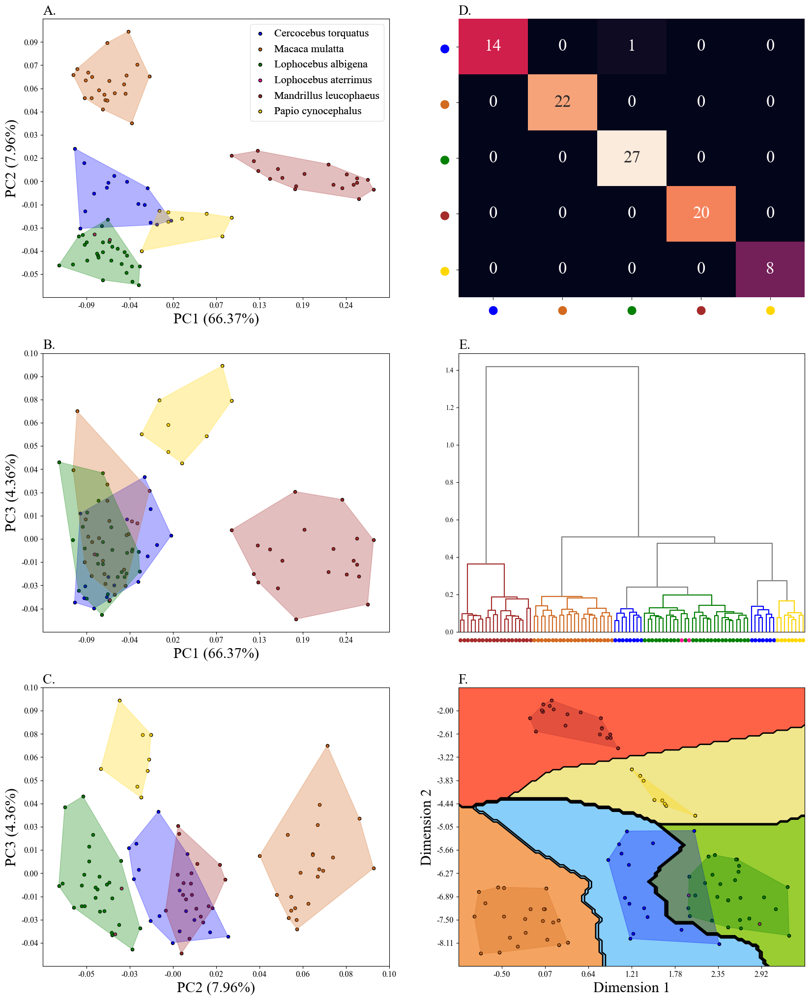

In [22]:
# Set global font properties for all plots
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

####################################################################################################################################
##                                      Analysis: PCA All Dataset Analysis                                                        ##
####################################################################################################################################

# Initialize PCA processing for 'PCA_all' dataset
prpca = procpca(df)  # Create PCA object for dataset
dataf, datag, ind, name = prpca.read('PCA_all.txt')  # Read dataset

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)  # Create PCA object for complete dataset
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')  # Read complete dataset

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                          PCA and Dimensionality Reduction Visualization                                               ##
####################################################################################################################################

# Create subplots for PCA and analysis visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first two principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Plot PCA with third and first principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

####################################################################################################################################
##                                 Confusion Matrix Visualization                                                          ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                 Hierarchical Clustering Dendrogram Visualization                                   ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
color = ['gray'] * (2 * num - 1)  # Initialize color array again
num = len(prpca.GPApt)

x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Color assignment based on threshold
    if x2 < 10 * 20 + 5:
        color[num] = 'brown'
    if 10 * 20 + 5 <= x2 < 10 * 42 + 5:
        color[num] = 'chocolate'
    if (10 * 42 + 5 <= x2 < 10 * 50 + 5) or (10 * 79 + 5 <= x2 < 10 * 86 + 5):
        color[num] = 'blue'
    if 10 * 50 + 5 <= x2 < 10 * 80 + 5:
        color[num] = 'green'
    if x2 > 10 * 85 + 5:
        color[num] = 'gold'
    if num > 183:
        color[num] = 'gray'
    
    color[181] = 'gray'
    color[182] = 'gray'

    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)
fig_axes[1, 1].tick_params(axis='x', which='major', labelsize=40)

# Customize dendrogram labels
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')  # Set marker for label
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color based on class
    tick_label.set_fontsize("14")  # Set font size

fig_axes[1, 1].set_xticklabels(circle_labels)  # Set x-tick labels
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                 t-SNE Visualization                                                                     ##
####################################################################################################################################

# Plot t-SNE for dimensionality reduction with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=50, n_neighbors=5)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

####################################################################################################################################
##                                                Save and Display the Final Figure                                       ##
####################################################################################################################################

# Save the entire figure as an SVG file
plt.savefig('PCA_all.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


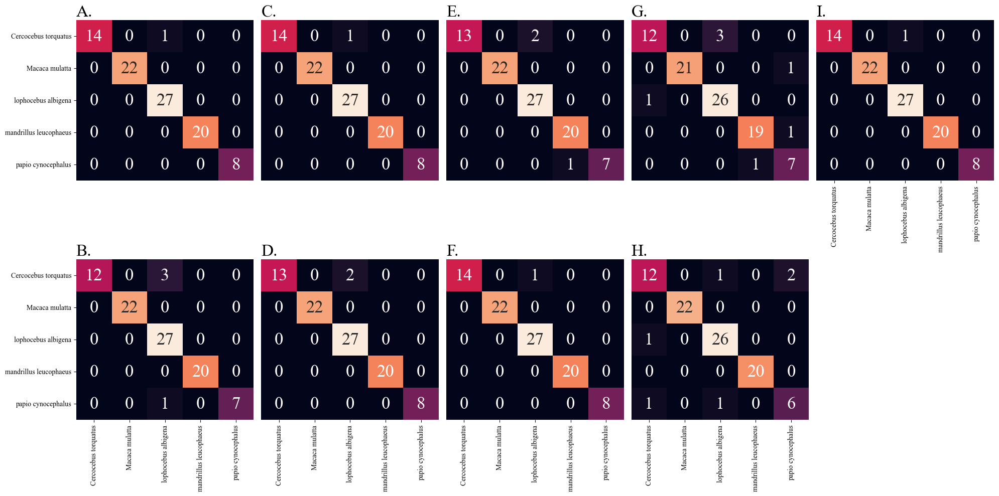

In [23]:
####################################################################################################################################
##                                                      Confusion Matrix Visualization - Multiple Plots                              ##
####################################################################################################################################

# Initialize figure and axes for the confusion matrix subplots (5 columns, 2 rows)
fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))

# Plot confusion matrix for each set of true and predicted labels
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size': 25})
fig_axes[0, 0].set_title('A.', fontsize=24, loc='left')
fig_axes[0, 0].set_xticks([])  # Hide x-ticks
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1, 0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size': 25})
fig_axes[1, 0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0, 1], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 1].set_title('C.', fontsize=24, loc='left')
fig_axes[0, 1].set_xticks([])  # Hide x-ticks
fig_axes[0, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1, 1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size': 25})
fig_axes[1, 1].set_title('D.', fontsize=24, loc='left')
fig_axes[1, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0, 2], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 2].set_title('E.', fontsize=24, loc='left')
fig_axes[0, 2].set_xticks([])  # Hide x-ticks
fig_axes[0, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1, 2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size': 25})
fig_axes[1, 2].set_title('F.', fontsize=24, loc='left')
fig_axes[1, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0, 3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size': 25})
fig_axes[0, 3].set_title('G.', fontsize=24, loc='left')
fig_axes[0, 3].set_xticks([])  # Hide x-ticks
fig_axes[0, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1, 3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size': 25})
fig_axes[1, 3].set_title('H.', fontsize=24, loc='left')
fig_axes[1, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0, 4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size': 25})
fig_axes[0, 4].set_title('I.', fontsize=24, loc='left')
fig_axes[0, 4].set_yticks([])  # Hide y-ticks

# Turn off the axis for the empty subplot in the bottom right
fig_axes[1, 4].axis('off')

# Adjust layout to prevent overlap of elements
fig.tight_layout()

# Save the figure as an SVG file and display it
plt.savefig('CM_all.svg', transparent=True, bbox_inches="tight")
plt.show()


# Figure 5: Plots depicting the papionin data after the removal of the Lophocebus albigena (green) taxon. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

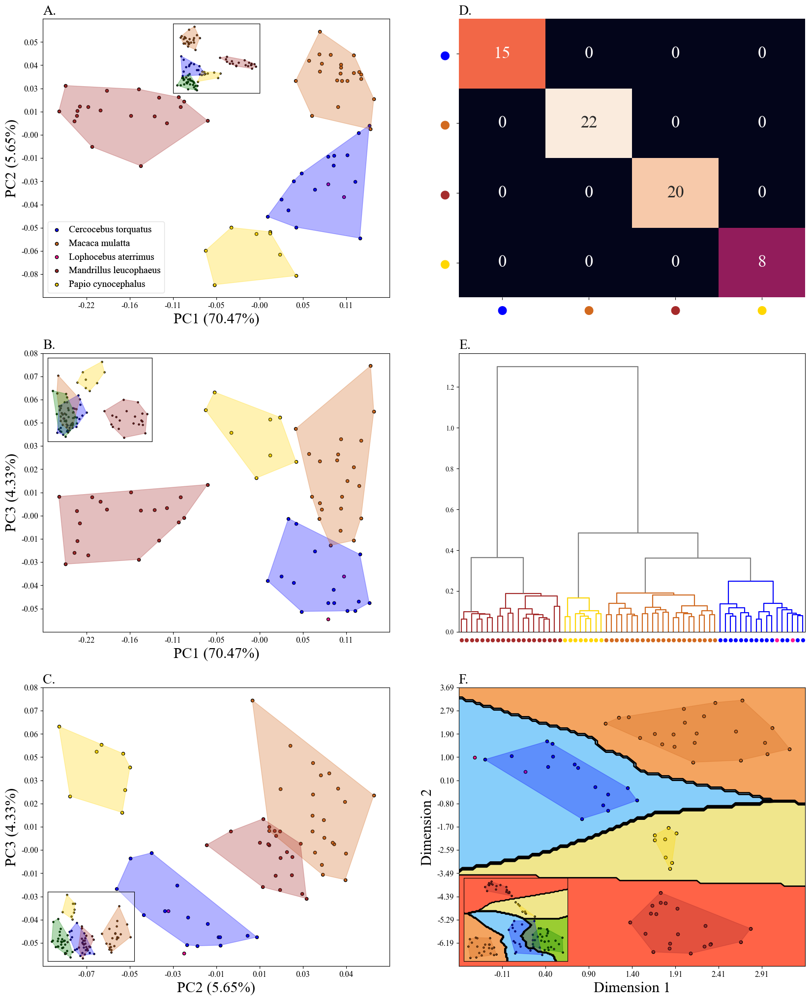

In [24]:
# Set global font properties for all plots
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

####################################################################################################################################
##                                      Analysis: without Lopocebus Albigena Dataset Analysis                                     ##
####################################################################################################################################

# Initialize PCA processing for 'without lophocebus albigena' dataset
prpca = procpca(df)  # Create PCA object for dataset
dataf, datag, ind, name = prpca.read('without lophocebus albigena.txt')  # Read dataset

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)  # Create PCA object for complete dataset
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')  # Read complete dataset

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                          PCA and Dimensionality Reduction Visualization                                               ##
####################################################################################################################################

# Create subplots for PCA and analysis visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first two principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=14)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Create inset axis for smaller plot inside first PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="25%", height="25%", loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Create inset axis for second subplot inside PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with third and first principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Create inset axis for third subplot inside PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="25%", height="25%", loc='lower left')
inset_axest.patch.set_alpha(0.35)
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                 Confusion Matrix Visualization                                                          ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                 Hierarchical Clustering Dendrogram Visualization                                   ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)
    if x2 < 10 * 20 + 5:
        color[num] = 'brown'  # Color assignment based on threshold
    if 10 * 20 + 5 <= x2 < 10 * 28 + 5:
        color[num] = 'gold'
    if 10 * 28 + 5 <= x2 < 10 * 50 + 5:
        color[num] = 'chocolate'
    if x2 >= 10 * 50 + 5:
        color[num] = 'blue'
    if num > 128:
        color[num] = 'gray'
    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    labs.append(prpca.y[l_e])  # Append corresponding label
    tick_label.set_label('●')  # Set marker for label
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color based on class
    tick_label.set_fontsize("14")  # Set font size

fig_axes[1, 1].set_xticklabels(circle_labels)  # Set x-tick labels
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                 t-SNE Visualization                                                                     ##
####################################################################################################################################

# Plot t-SNE for dimensionality reduction with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Create inset axis for zoomed t-SNE view
inset_axest = inset_axes(fig_axes[2, 1], width="30%", height="30%", loc='lower left')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                                Save and Display the Final Figure                                       ##
####################################################################################################################################

# Save the entire figure as an SVG file
plt.savefig('without lophocebus albigena.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


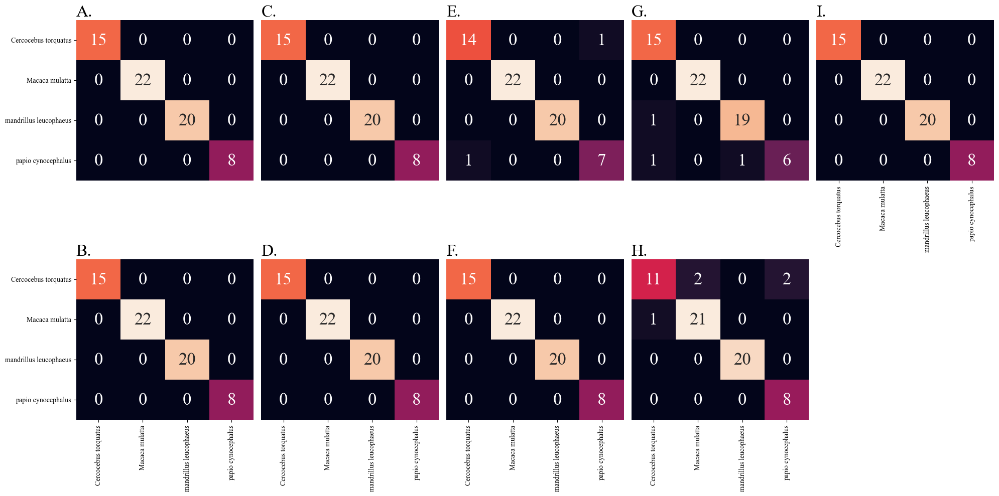

In [25]:
####################################################################################################################################
##                                                      Confusion Matrix Visualization - Multiple Plots                              ##
####################################################################################################################################

# Initialize figure and axes for the confusion matrix subplots (5 columns, 2 rows)
fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))

# Plot confusion matrix for each set of true and predicted labels
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size': 25})
fig_axes[0, 0].set_title('A.', fontsize=24, loc='left')
fig_axes[0, 0].set_xticks([])  # Hide x-ticks

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1, 0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size': 25})
fig_axes[1, 0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0, 1], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 1].set_title('C.', fontsize=24, loc='left')
fig_axes[0, 1].set_xticks([])  # Hide x-ticks
fig_axes[0, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1, 1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size': 25})
fig_axes[1, 1].set_title('D.', fontsize=24, loc='left')
fig_axes[1, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0, 2], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 2].set_title('E.', fontsize=24, loc='left')
fig_axes[0, 2].set_xticks([])  # Hide x-ticks
fig_axes[0, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1, 2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size': 25})
fig_axes[1, 2].set_title('F.', fontsize=24, loc='left')
fig_axes[1, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0, 3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size': 25})
fig_axes[0, 3].set_title('G.', fontsize=24, loc='left')
fig_axes[0, 3].set_xticks([])  # Hide x-ticks
fig_axes[0, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1, 3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size': 25})
fig_axes[1, 3].set_title('H.', fontsize=24, loc='left')
fig_axes[1, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0, 4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size': 25})
fig_axes[0, 4].set_title('I.', fontsize=24, loc='left')
fig_axes[0, 4].set_yticks([])  # Hide y-ticks

# Turn off the axis for the empty subplot in the bottom right
fig_axes[1, 4].axis('off')

# Adjust layout to prevent overlap of elements
fig.tight_layout()

# Save the figure as an SVG file and display it
plt.savefig('CM_without_lophocebus_albigena.svg', transparent=True, bbox_inches="tight")
plt.show()

# Figure 6: Plots depicting the papionin data after removing the Macaca mulatta (orange) taxon. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

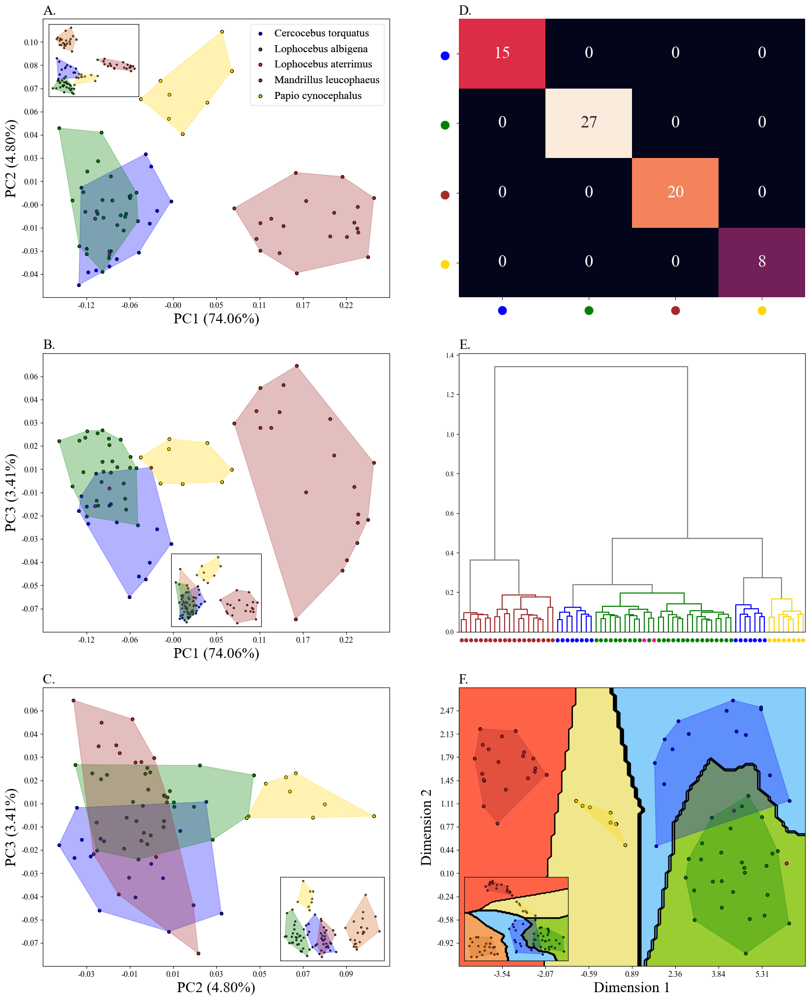

In [26]:
####################################################################################################################################
##                                                   without macaca mulatta                                               ##
####################################################################################################################################

# Initialize PCA processing for 'without macaca mulatta' dataset
prpca = procpca(df)  # Create PCA object for dataset
dataf, datag, ind, name = prpca.read('without macaca mulatta.txt')  # Read dataset

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)  # Create PCA object for complete dataset
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')  # Read complete dataset

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                                      PCA and Dimensionality Reduction Visualization                                    ##
####################################################################################################################################

# Create subplots for PCA and analysis visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first two principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Create inset axis for smaller plot inside first PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="26%", height="26%", loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Create inset axis for second subplot inside PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="26%", height="26%", loc='lower center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with third and first principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Create inset axis for third subplot inside PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                 Confusion Matrix Visualization                                                          ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                 Hierarchical Clustering Dendrogram Visualization                                   ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Color assignment based on threshold
    if x2 < 10 * 20 + 5:
        color[num] = 'brown'
    if 10 * 20 + 5 <= x2 < 10 * 28 + 5 or 10 * 57 + 5 <= x2 < 10 * 64 + 5:
        color[num] = 'blue'
    if 10 * 28 + 5 <= x2 < 10 * 57 + 5:
        color[num] = 'green'
    if x2 > 10 * 64 + 5:
        color[num] = 'gold'

    if num > 137:
        color[num] = 'gray'

    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels with color and size
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')  # Set marker for label
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color based on class
    tick_label.set_fontsize("14")  # Set font size

fig_axes[1, 1].set_xticklabels(circle_labels)  # Set x-tick labels
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                 t-SNE Visualization                                                                     ##
####################################################################################################################################

# Plot t-SNE for dimensionality reduction with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Inset t-SNE plot for comparison
inset_axest = inset_axes(fig_axes[2, 1], width="30%", height="30%", loc='lower left')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                           Save and Display Plot                                                        ##
####################################################################################################################################

# Save the entire figure as an SVG file
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('without macaca mulatta.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


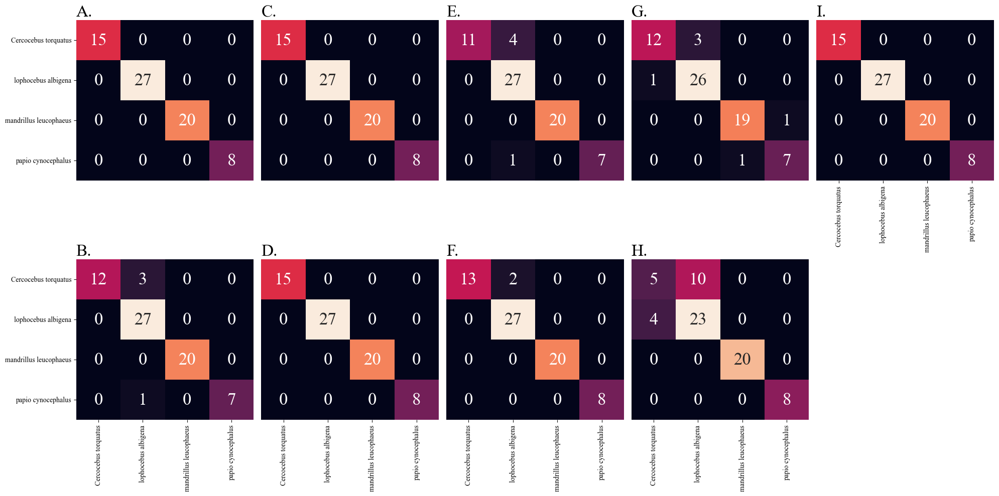

In [27]:
####################################################################################################################################
##                                                      Confusion Matrix Visualization - Multiple Plots                           ##
####################################################################################################################################

# Initialize figure and axes for the confusion matrix subplots (5 columns, 2 rows)
fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))

# Plot confusion matrix for each set of true and predicted labels
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size': 25})
fig_axes[0, 0].set_title('A.', fontsize=24, loc='left')
fig_axes[0, 0].set_xticks([])  # Hide x-ticks

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1, 0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size': 25})
fig_axes[1, 0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0, 1], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 1].set_title('C.', fontsize=24, loc='left')
fig_axes[0, 1].set_xticks([])  # Hide x-ticks
fig_axes[0, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1, 1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size': 25})
fig_axes[1, 1].set_title('D.', fontsize=24, loc='left')
fig_axes[1, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0, 2], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 2].set_title('E.', fontsize=24, loc='left')
fig_axes[0, 2].set_xticks([])  # Hide x-ticks
fig_axes[0, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1, 2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size': 25})
fig_axes[1, 2].set_title('F.', fontsize=24, loc='left')
fig_axes[1, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0, 3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size': 25})
fig_axes[0, 3].set_title('G.', fontsize=24, loc='left')
fig_axes[0, 3].set_xticks([])  # Hide x-ticks
fig_axes[0, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1, 3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size': 25})
fig_axes[1, 3].set_title('H.', fontsize=24, loc='left')
fig_axes[1, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0, 4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size': 25})
fig_axes[0, 4].set_title('I.', fontsize=24, loc='left')
fig_axes[0, 4].set_yticks([])  # Hide y-ticks

# Turn off the axis for the empty subplot in the bottom right
fig_axes[1, 4].axis('off')

# Adjust layout to prevent overlap of elements
fig.tight_layout()

# Save the figure as an SVG file and display it
plt.savefig('CM_without_macaca_mulatta.svg', transparent=True, bbox_inches="tight")
plt.show()


#  Figure 7: Plots depicting the papionin data after the first case of sample removal.

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

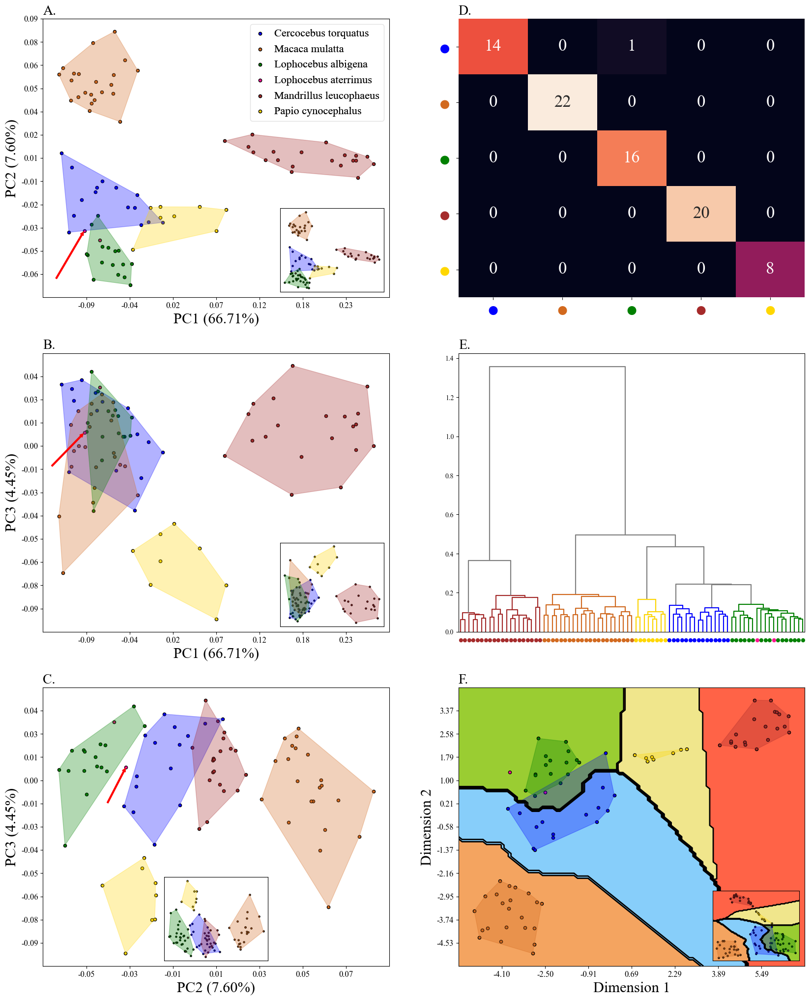

In [28]:
####################################################################################################
##                                       Lophocebus Albigena #2                                   ##
####################################################################################################

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

# Initialize PCA processing
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('lophocebus albigena #2.txt')

prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Extract data
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg

# Label encoding
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Axis labels
x_axis_labels = prpca.encoder.classes_.tolist()
y_axis_labels = prpca.encoder.classes_.tolist()
dataf.shape

# Evaluation
yt, yp, xl = eval()

# Visual elements
circle_labels = ['●', '●', '●', '●', '●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']


####################################################################################################################################
##                                  PCA Visualization and Analysis                                                                ##
####################################################################################################################################

# Figure setup
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# PCA Plots
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

addarrow(ind=66, ind1=1, ind2=2, ax=fig_axes[0, 0], rotate=60)

inset_axest = inset_axes(fig_axes[0, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

addarrow(ind=66, ind1=1, ind2=3, ax=fig_axes[1, 0], rotate=45)

inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

addarrow(ind=66, ind1=2, ind2=3, ax=fig_axes[2, 0], rotate=110)

inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='lower center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                                ##
####################################################################################################################################

# Heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])
    tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])
    tick_label.set_fontsize("30")

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                              ##
####################################################################################################################################

# Dendrogram setup
num = len(prpca.GPApt)
color = ['gray'] * (2 * num - 1)

d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]

x_l = []
for i, posi in enumerate(coord):
    x1, x2 = posi[0], posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)
    
    if x2 < 205:
        color[num] = 'brown'
    elif x2 < 425:
        color[num] = 'chocolate'
    elif x2 < 505:
        color[num] = 'gold'
    elif x2 < 655:
        color[num] = 'blue'
    elif x2 > 645:
        color[num] = 'green'

    if num > 158:
        color[num] = 'gray'
    num += 1

d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

circle_labels = ['●' for _ in prpca.y]
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                                      ##
####################################################################################################################################

# t-SNE plot
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='lower right')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                  Save and Display Plot                                                                         ##
####################################################################################################################################

# Final setup and save
plt.savefig('lophocebus albigena #2.svg', transparent=False, bbox_inches='tight')
plt.show()


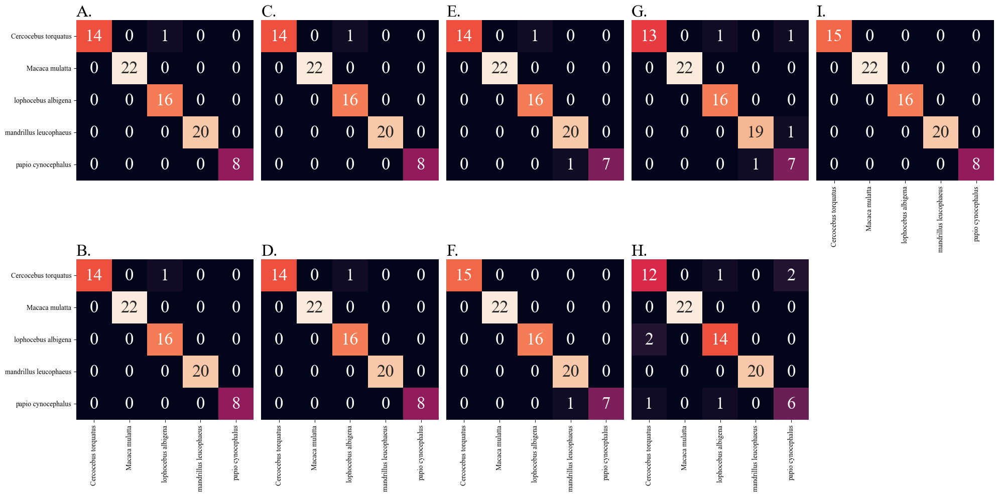

In [29]:
# Plotting the confusion matrices

# Initialize figure and axes for subplots (5 columns, 2 rows)
fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))

# Plotting the confusion matrices one by one for each of the subplots
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size': 25})
fig_axes[0, 0].set_title('A.', fontsize=24, loc='left')
fig_axes[0, 0].set_xticks([])  # Hide x-ticks

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1, 0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size': 25})
fig_axes[1, 0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0, 1], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 1].set_title('C.', fontsize=24, loc='left')
fig_axes[0, 1].set_xticks([])  # Hide x-ticks
fig_axes[0, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1, 1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size': 25})
fig_axes[1, 1].set_title('D.', fontsize=24, loc='left')
fig_axes[1, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0, 2], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 2].set_title('E.', fontsize=24, loc='left')
fig_axes[0, 2].set_xticks([])  # Hide x-ticks
fig_axes[0, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1, 2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size': 25})
fig_axes[1, 2].set_title('F.', fontsize=24, loc='left')
fig_axes[1, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0, 3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size': 25})
fig_axes[0, 3].set_title('G.', fontsize=24, loc='left')
fig_axes[0, 3].set_xticks([])  # Hide x-ticks
fig_axes[0, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1, 3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size': 25})
fig_axes[1, 3].set_title('H.', fontsize=24, loc='left')
fig_axes[1, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0, 4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size': 25})
fig_axes[0, 4].set_title('I.', fontsize=24, loc='left')
fig_axes[0, 4].set_yticks([])  # Hide y-ticks

# Turn off the axis for the last subplot (bottom-right corner)
fig_axes[1, 4].axis('off')

# Adjust layout to ensure no overlap
fig.tight_layout()

# Save and display the plot
plt.savefig('CM_lophocebus_albigena_#2.svg', transparent=True, bbox_inches="tight")
plt.show()


# Figure 8: Plots depicting the papionin data after the second case of sample removal. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

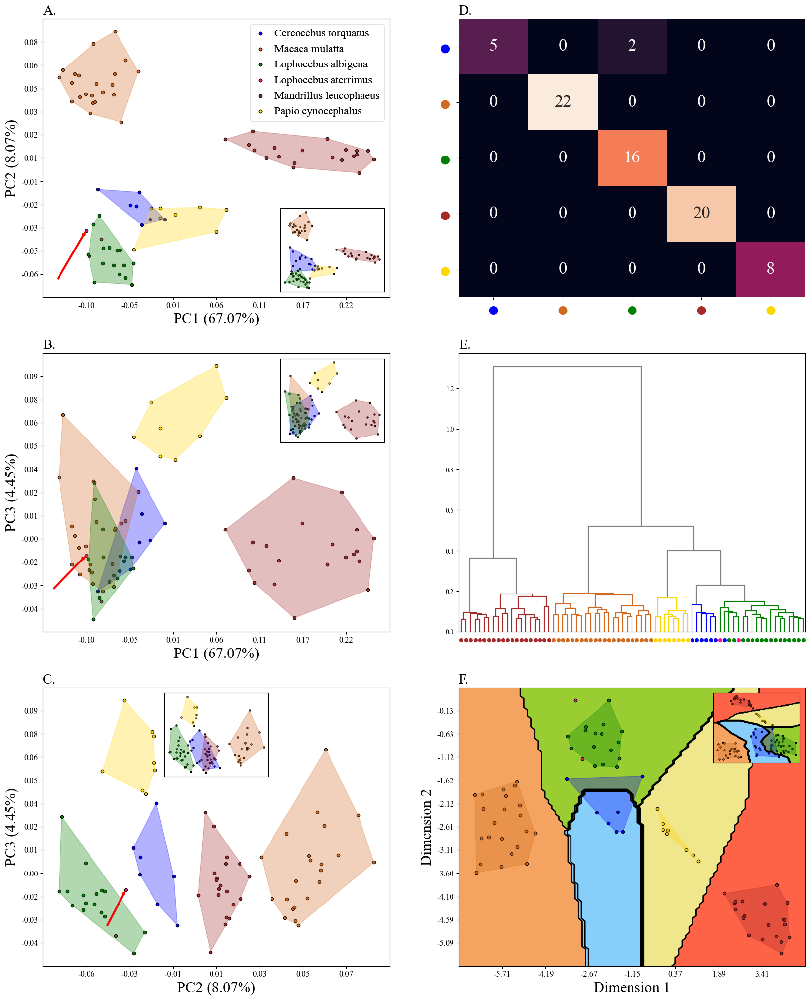

In [30]:
####################################################################################################
##                         cercocebus torquatus and lophocebus albigena #1                        ##
####################################################################################################

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

# Initialize PCA processing
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('cercocebus torquatus and lophocebus albigena manipulation1.txt')

prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Extract data
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg

# Label encoding
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Axis labels
x_axis_labels = prpca.encoder.classes_.tolist()
y_axis_labels = prpca.encoder.classes_.tolist()
dataf.shape

# Evaluation
yt, yp, xl = eval()

# Visual elements
circle_labels = ['●', '●', '●', '●', '●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']


####################################################################################################################################
##                                  PCA Visualization and Analysis                                                                ##
####################################################################################################################################

# Figure setup
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# PCA Plots
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

addarrow(ind=66, ind1=1, ind2=2, ax=fig_axes[0, 0], rotate=60)

inset_axest = inset_axes(fig_axes[0, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

addarrow(ind=66, ind1=1, ind2=3, ax=fig_axes[1, 0], rotate=45)

inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

addarrow(ind=66, ind1=2, ind2=3, ax=fig_axes[2, 0], rotate=110)

inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                                ##
####################################################################################################################################

# Heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])
    tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])
    tick_label.set_fontsize("30")

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                              ##
####################################################################################################################################

# Dendrogram setup
num = len(prpca.GPApt)
color = ['gray'] * (2 * num - 1)

d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42  + 5:
                color[num] = 'chocolate'
        if x2 >= 10*42 + 5 and x2 < 10*50  + 5:
                color[num] = 'gold'
        if x2 >= 10*50 + 5 and x2 < 10*56 + 5:
                color[num] = 'blue'
        if x2 > 10*56 + 5:
                color[num] = 'green'

        if num > 143:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

circle_labels = ['●' for _ in prpca.y]
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                                      ##
####################################################################################################################################

# t-SNE plot
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='upper right')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                  Save and Display Plot                                                                         ##
####################################################################################################################################

# Final setup and save
plt.savefig('cercocebus torquatus and lophocebus albigena 1.svg', transparent=False, bbox_inches='tight')
plt.show()


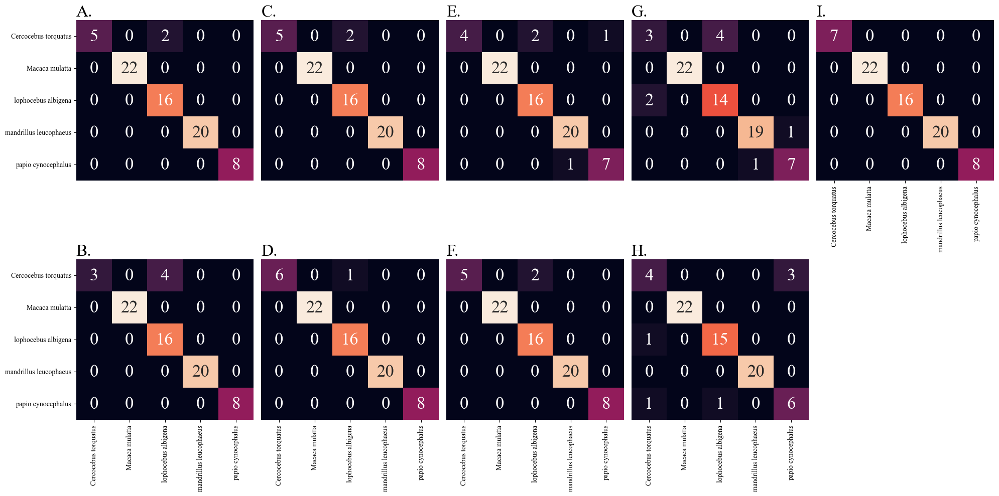

In [31]:
# Initialize figure and axes for subplots (5 columns, 2 rows)
fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20, 10))

# Plot the confusion matrices one by one for each subplot
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size': 25})
fig_axes[0, 0].set_title('A.', fontsize=24, loc='left')
fig_axes[0, 0].set_xticks([])  # Hide x-ticks

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1, 0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size': 25})
fig_axes[1, 0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0, 1], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 1].set_title('C.', fontsize=24, loc='left')
fig_axes[0, 1].set_xticks([])  # Hide x-ticks
fig_axes[0, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1, 1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size': 25})
fig_axes[1, 1].set_title('D.', fontsize=24, loc='left')
fig_axes[1, 1].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0, 2], annot=True, cbar=False, annot_kws={'size': 25})
fig_axes[0, 2].set_title('E.', fontsize=24, loc='left')
fig_axes[0, 2].set_xticks([])  # Hide x-ticks
fig_axes[0, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1, 2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size': 25})
fig_axes[1, 2].set_title('F.', fontsize=24, loc='left')
fig_axes[1, 2].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0, 3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size': 25})
fig_axes[0, 3].set_title('G.', fontsize=24, loc='left')
fig_axes[0, 3].set_xticks([])  # Hide x-ticks
fig_axes[0, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1, 3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size': 25})
fig_axes[1, 3].set_title('H.', fontsize=24, loc='left')
fig_axes[1, 3].set_yticks([])  # Hide y-ticks

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0, 4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size': 25})
fig_axes[0, 4].set_title('I.', fontsize=24, loc='left')
fig_axes[0, 4].set_yticks([])  # Hide y-ticks

# Turn off the axis for the last subplot (bottom-right corner)
fig_axes[1, 4].axis('off')

# Adjust layout to ensure no overlap
fig.tight_layout()

# Save and display the plot
plt.savefig('CM_cercocebus_torquatus_and_lophocebus_albigena_manipulation1.svg', transparent=True, bbox_inches="tight")
plt.show()

# Figure 9: Plots depicting the papionin data after the first case of landmark removal. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

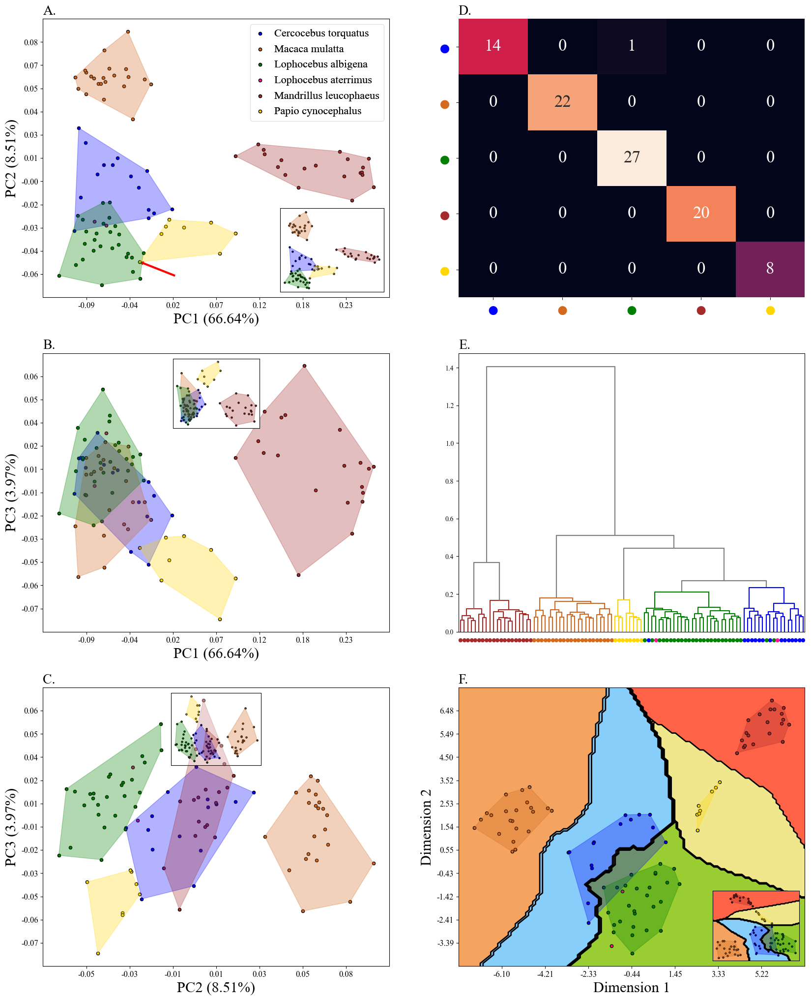

In [32]:
####################################################################################################################################
##                                                   all without 23, 24, 25, 26, 27                                               ##
####################################################################################################################################

# Initialize PCA processing for 'all without 23, 24, 25, 26, 27' dataset
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('all without 23, 24, 25, 26, 27.txt')

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                                  PCA Visualization and Analysis                                                                ##
####################################################################################################################################

# Create subplots for PCA visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first and second principal components
arrow = mpatches.FancyArrowPatch((0.02, -0.06), (-0.0265, -0.051), color='red', edgecolor='black', mutation_scale=10)
fig_axes[0, 0].add_patch(arrow)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with first and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="25%", height="25%", loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="26%", height="26%", loc='upper center')
inset_axest.patch.set_alpha(0.35)
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                                ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                              ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
color = ['gray'] * (2 * num - 1)  # Reinitialize color list for nodes
num = len(prpca.GPApt)

x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Assign color based on distance
    if x2 < 10 * 20 + 5:
        color[num] = 'brown'
    elif 10 * 20 + 5 <= x2 < 10 * 42 + 5:
        color[num] = 'chocolate'
    elif 10 * 42 + 5 <= x2 < 10 * 50 + 5:
        color[num] = 'gold'
    elif 10 * 50 + 5 <= x2 < 10 * 77 + 5:
        color[num] = 'green'
    elif x2 > 10 * 77 + 5:
        color[num] = 'blue'

    if num > 181:
        color[num] = 'gray'

    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels with color and size
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)  # Update tick labels for dendrogram
fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                                      ##
####################################################################################################################################

# Plot t-SNE with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Add inset t-SNE plot for comparison
inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='lower right')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                  Save and Display Plot                                                                         ##
####################################################################################################################################

# Set font style and save the figure as an SVG file
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('all_without_23_24_25_26_27.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


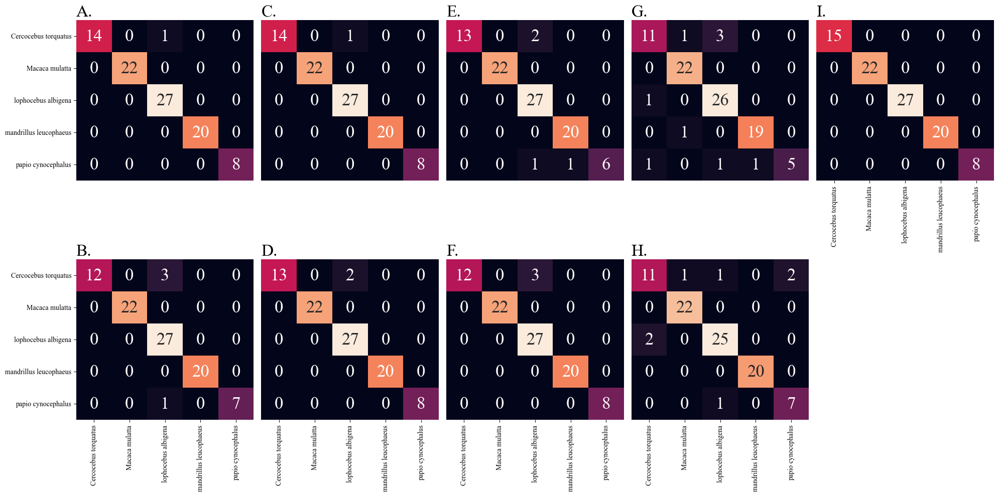

In [33]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize=24, loc='left')
fig_axes[0,0].set_xticks([])

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize=24, loc='left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize=24, loc='left')
fig_axes[1,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize=24, loc='left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize=24, loc='left')
fig_axes[1,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize=24, loc='left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize=24, loc='left')
fig_axes[1,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize=24, loc='left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_all_without_23_24_25_26_27.svg', transparent=True, bbox_inches="tight")
plt.show()


# Figure 10: Plots depicting the papionin data after the second case of landmark removal. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

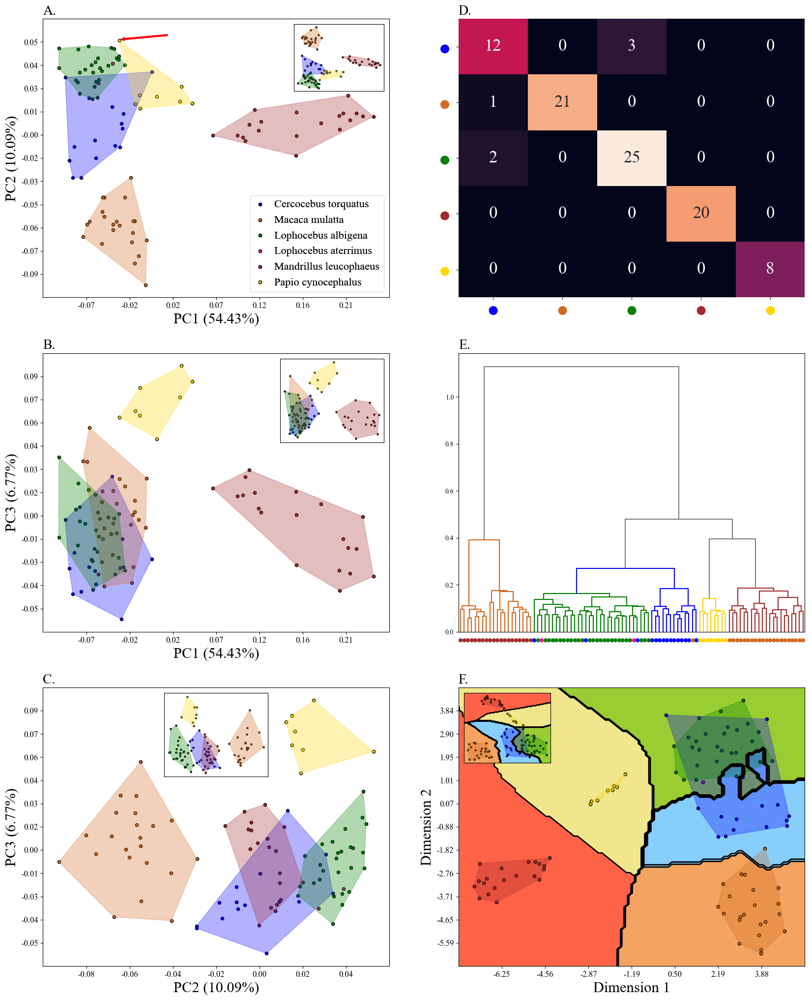

In [34]:
####################################################################################################################################
##                                           all without 11, 12, 16, 17, 18, 30, 31                                               ##
####################################################################################################################################

# Initialize PCA processing for 'all without 11, 12, 16, 17, 18, 30, 31' dataset
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('all without 11, 12, 16, 17, 18, 30, 31.txt')

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                                  PCA Visualization and Analysis                                                           ##
####################################################################################################################################

# Create subplots for PCA visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first and second principal components
arrow = mpatches.FancyArrowPatch((0.02, 0.058), (-0.0318, 0.0552), color='red', edgecolor='black', mutation_scale=10)
fig_axes[0, 0].add_patch(arrow)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="26%", height="24%", loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with first and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                          ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                     ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
color = ['gray'] * (2 * num - 1)  # Reinitialize color list for nodes
num = len(prpca.GPApt)

x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Assign color based on distance
    if x2 < 10 * 20 + 5:
        color[num] = 'chocolate'
    elif 10 * 20 + 5 <= x2 < 10 * 52 + 5:
        color[num] = 'green'
    elif 10 * 52 + 5 <= x2 < 10 * 65 + 5:
        color[num] = 'blue'
    elif 10 * 65 + 5 <= x2 < 10 * 73 + 5:
        color[num] = 'gold'
    elif x2 > 10 * 73 + 5:
        color[num] = 'brown'

    if num > 183:
        color[num] = 'gray'

    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels with color and size
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)  # Update tick labels

fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                               ##
####################################################################################################################################

# Plot t-SNE with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=30)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Add inset t-SNE plot for comparison
inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='upper left')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                  Save and Display Plot                                                                  ##
####################################################################################################################################

# Set font style and save the figure as an SVG file
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('all without 11, 12, 16, 17, 18, 30, 31.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


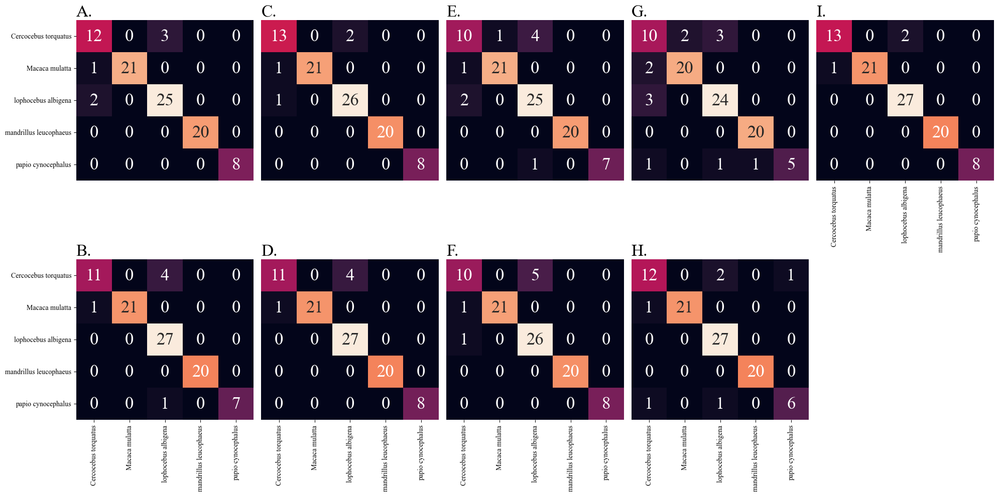

In [35]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize=24, loc='left')
fig_axes[0,0].set_xticks([])

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize=24, loc='left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize=24, loc='left')
fig_axes[1,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize=24, loc='left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize=24, loc='left')
fig_axes[1,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize=24, loc='left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize=24, loc='left')
fig_axes[1,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize=24, loc='left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_all_without_11_12_16_17_18_30_31.svg', transparent=True, bbox_inches="tight")
plt.show()


# Figure 11: Plots depicting the papionin data in the first extreme case. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

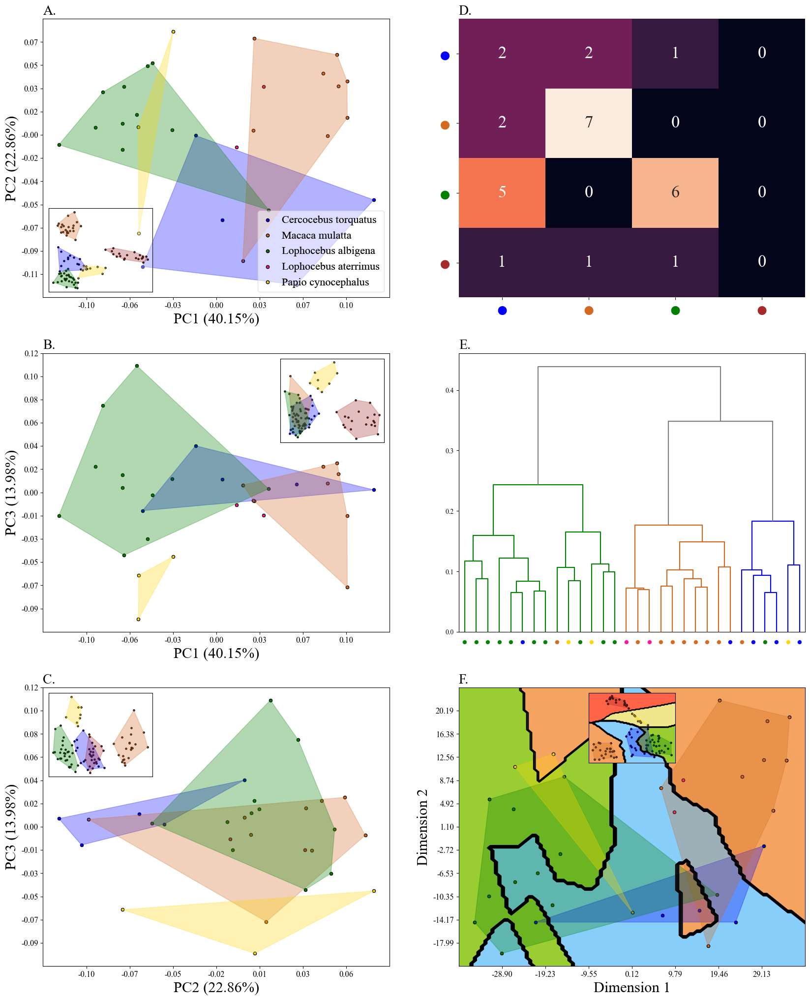

In [36]:
####################################################################################################################################
##                                                      Extreme_case#1_2_3_4_6_14                                                 ##
####################################################################################################################################

# Initialize PCA processing for 'Extreme_case#1_2_3_4_6_14' dataset
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('Extreme_case#1_2_3_4_6_14.txt')

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                                  PCA Visualization and Analysis                                                           ##
####################################################################################################################################

# Create subplots for PCA visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first and second principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="30%", height="30%", loc='lower left')
inset_axest.patch.set_alpha(0.35)
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with first and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                          ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                     ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
color = ['gray'] * (2 * num - 1)  # Reinitialize color list for nodes
num = len(prpca.GPApt)

x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Assign color based on distance
    if x2 < 10 * 14 + 5:
        color[num] = 'green'
    elif 10 * 14 + 5 <= x2 < 10 * 24 + 5:
        color[num] = 'chocolate'
    elif x2 > 10 * 24 + 5:
        color[num] = 'blue'

    if num > 56:
        color[num] = 'gray'

    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels with color and size
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)  # Update tick labels

fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                               ##
####################################################################################################################################

# Plot t-SNE with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=5)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Add inset t-SNE plot for comparison
inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='upper center')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                  Save and Display Plot                                                                  ##
####################################################################################################################################

# Set font style for the figure and save it as an SVG file
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('Extreme_case#1_2_3_4_6_14.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


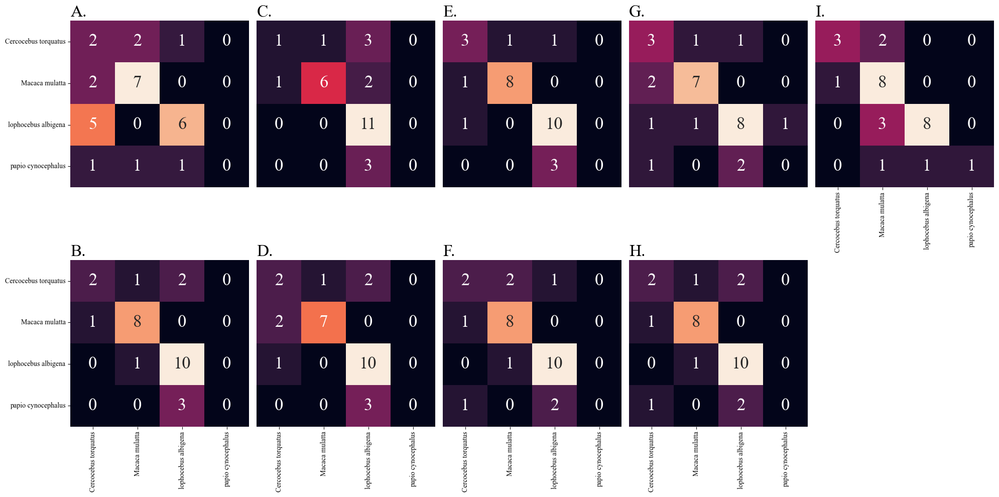

In [37]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize=24, loc='left')
fig_axes[0,0].set_xticks([])

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize=24, loc='left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize=24, loc='left')
fig_axes[1,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize=24, loc='left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize=24, loc='left')
fig_axes[1,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize=24, loc='left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize=24, loc='left')
fig_axes[1,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize=24, loc='left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_Extreme_case#1_2_3_4_6_14.svg', transparent=True, bbox_inches="tight")
plt.show()


# Figure 12: Plots depicting the papionin data in the second extreme case. 

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

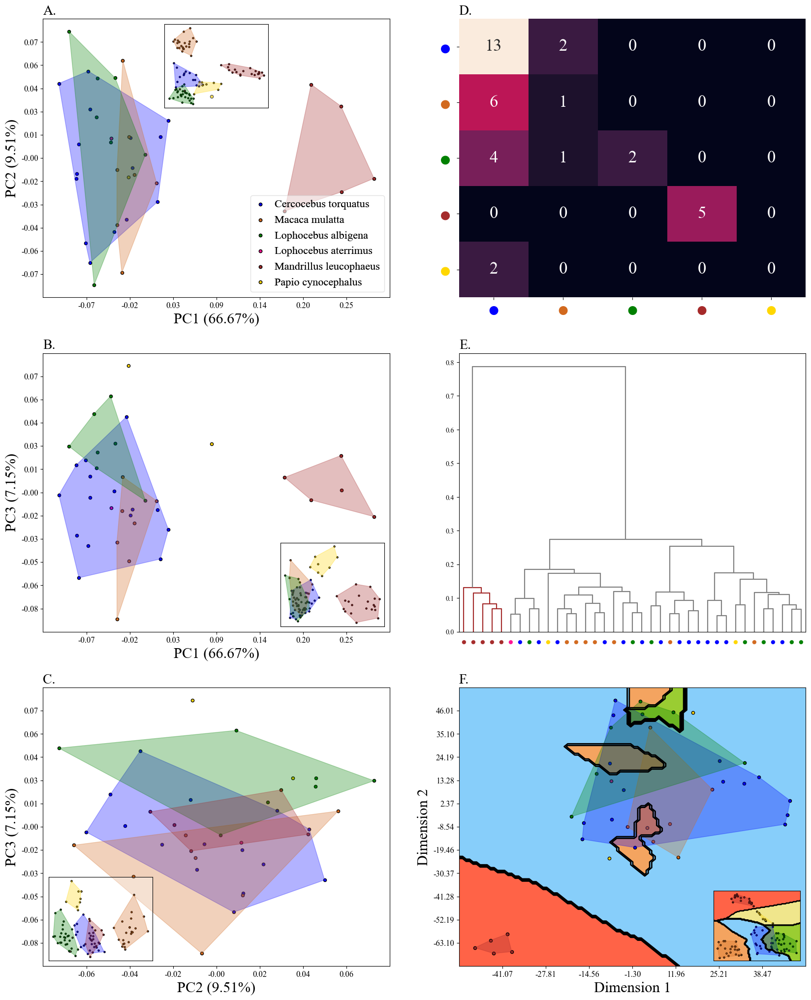

In [38]:
####################################################################################################################################
##                                                      extreme_case#2_1_2_3_4_14                                                 ##
####################################################################################################################################

# Initialize PCA processing for 'extreme_case#2_1_2_3_4_14' dataset
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('extreme_case#2_1_2_3_4_14.txt')

# Initialize PCA processing for the complete dataset (PCA_all.txt)
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

# Define variables for later use
Xs = prpca.GPApt  # PCA-transformed data
X3 = prpca.x[:, :2]  # First two principal components
X10 = prpca.x[:, :10]  # First ten principal components
y = prpca.y  # Labels for the data
ys = prpca.ys  # Encoded labels for the data
y0 = prpca.y0  # Original labels
deletg = prpca.deletg  # Data points to delete

# Check the number of 'lophocebus albigena' instances in y0
len(np.where(y0 == 'lophocebus albigena')[0])

# Encode labels for the data using LabelEncoder
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)

# Define axis labels for plots
x_axis_labels = prpca.encoder.classes_.tolist()  # x-axis labels (encoded classes)
y_axis_labels = prpca.encoder.classes_.tolist()  # y-axis labels (encoded classes)

# Check the shape of the data
dataf.shape

# Variables for confusion matrix and plot labels
yt, yp, xl = eval()  # Evaluate confusion matrix variables (actual vs predicted)

# Define labels and colors for plotting
circle_labels = ['●', '●', '●', '●', '●']  # Circle markers for data points
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']  # Color scheme for markers

####################################################################################################################################
##                                  PCA Visualization and Analysis                                                           ##
####################################################################################################################################

# Create subplots for PCA visualizations (2 columns, 3 rows)
fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20, 25))

# Plot PCA with first and second principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax=fig_axes[0, 0], index_r=0, dlegend=True, annote=False, legend_font_s=16)
fig_axes[0, 0].set_title('A.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[0, 0], width="30%", height="30%", loc='upper center')
inset_axest.patch.set_alpha(0.35)
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with first and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax=fig_axes[1, 0], index_r=0, dlegend=False)
fig_axes[1, 0].set_title('B.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[1, 0], width="30%", height="30%", loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

# Plot PCA with second and third principal components
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax=fig_axes[2, 0], index_r=0, dlegend=False)
fig_axes[2, 0].set_title('C.', fontsize=20, loc='left')

# Add inset plot for smaller PCA plot
inset_axest = inset_axes(fig_axes[2, 0], width="30%", height="30%", loc='lower left')
inset_axest.patch.set_alpha(0.35)
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax=inset_axest, index_r=0, dlegend=False, annote=False, ticks=False, size=5)

####################################################################################################################################
##                                  Confusion Matrix Visualization                                                                ##
####################################################################################################################################

# Plot confusion matrix using Seaborn heatmap
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0, 1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size': 25})

# Customize confusion matrix labels (color and font size)
for i, tick_label in enumerate(fig_axes[0, 1].get_xticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

for i, tick_label in enumerate(fig_axes[0, 1].get_yticklabels()):
    tick_label.set_color(colours[i])  # Set label color
    tick_label.set_fontsize("30")  # Set font size

fig_axes[0, 1].set_title('D.', fontsize=20, loc='left')

####################################################################################################################################
##                                  Hierarchical Clustering Dendrogram Visualization                                              ##
####################################################################################################################################

# Plot dendrogram for hierarchical clustering
num = len(prpca.GPApt)  # Number of data points
color = ['gray'] * (2 * num - 1)  # Initialize color array for dendrogram nodes
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)  # Plot the dendrogram

# Add labels for nodes in the dendrogram based on color coding
coord = np.c_[np.array(d['icoord'])[:, 1:3], np.array(d['dcoord'])[:, 1]]
coord = coord[np.argsort(coord[:, 2])]
color = ['gray'] * (2 * num - 1)  # Reinitialize color list for nodes
num = len(prpca.GPApt)

x_l = []  # List to store x-axis labels
for i, posi in enumerate(coord):
    x1 = posi[0]
    x2 = posi[1]
    if x1 not in x_l:
        x_l.append(x1)
    if x2 not in x_l:
        x_l.append(x2)

    # Assign color based on distance
    if x2 < 10 * 5 + 5:
        color[num] = 'brown'
    num += 1

# Redraw dendrogram with updated colors
d = plot_dendrogram(p=15, ax=fig_axes[1, 1], color_threshold=0.2)

# Customize dendrogram labels with color and size
circle_labels = ['●'] * len(prpca.y)  # Circle markers for dendrogram labels
colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']
labs = []  # List to store label names
for i, tick_label in enumerate(fig_axes[1, 1].get_xticklabels()):
    l_e = str(tick_label)[-4:-2]  # Extract label
    try:
        l_e = int(l_e)
    except:
        l_e = int(l_e[1:])
    
    # print(prpca.y[l_e])  # Print label
    labs.append(prpca.y[l_e])  # Append corresponding label

    tick_label.set_label('●')
    tick_label.set_color(colours[prpca.y[l_e]])  # Set color for the label
    tick_label.set_fontsize("14")  # Set font size for the label

fig_axes[1, 1].set_xticklabels(circle_labels)  # Update tick labels

fig_axes[1, 1].set_title('E.', fontsize=20, loc='left')

####################################################################################################################################
##                                  t-SNE Plot Visualization                                                                      ##
####################################################################################################################################

# Plot t-SNE with decision boundary and cross-validation
prpca.plot_tsne(decision_boundary=True, cv=True, ax=fig_axes[2, 1], n_r=4, index_r=0, perplexity=5)
fig_axes[2, 1].set_title('F.', fontsize=20, loc='left')

# Add inset t-SNE plot for comparison
inset_axest = inset_axes(fig_axes[2, 1], width="25%", height="25%", loc='lower right')
prpca_c.plot_tsne(decision_boundary=True, cv=True, ax=inset_axest, perplexity=50, ticks=False, size=5, n_neighbors=5)

####################################################################################################################################
##                                                      Save and Display Plot                                                     ##
####################################################################################################################################

# Set font style and save the final plot as an SVG file
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('extreme_case#2_1_2_3_4_14.svg', transparent=False, bbox_inches='tight')

# Display the plot
plt.show()


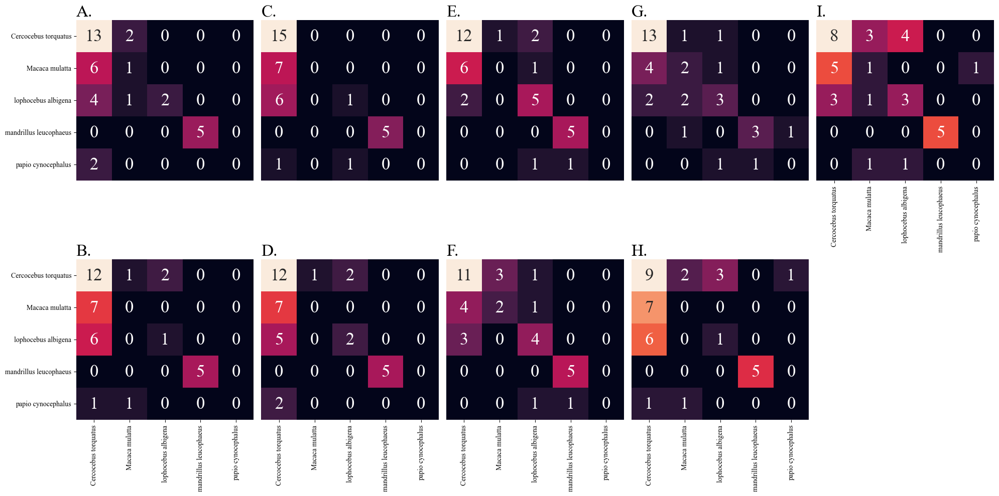

In [39]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax=fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize=24, loc='left')
fig_axes[0,0].set_xticks([])

sns.heatmap(confusion_matrix(yt[1], yp[1]), ax=fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize=24, loc='left')

sns.heatmap(confusion_matrix(yt[2], yp[2]), ax=fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize=24, loc='left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[3], yp[3]), ax=fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize=24, loc='left')
fig_axes[1,1].set_yticks([])

sns.heatmap(confusion_matrix(yt[4], yp[4]), ax=fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize=24, loc='left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[5], yp[5]), ax=fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize=24, loc='left')
fig_axes[1,2].set_yticks([])

sns.heatmap(confusion_matrix(yt[6], yp[6]), ax=fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize=24, loc='left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[7], yp[7]), ax=fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize=24, loc='left')
fig_axes[1,3].set_yticks([])

sns.heatmap(confusion_matrix(yt[8], yp[8]), ax=fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize=24, loc='left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_extreme_case#2_1_2_3_4_14.svg', transparent=True, bbox_inches="tight")
plt.show()


# Outlier Detection Local Outlier Factor

c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the ed

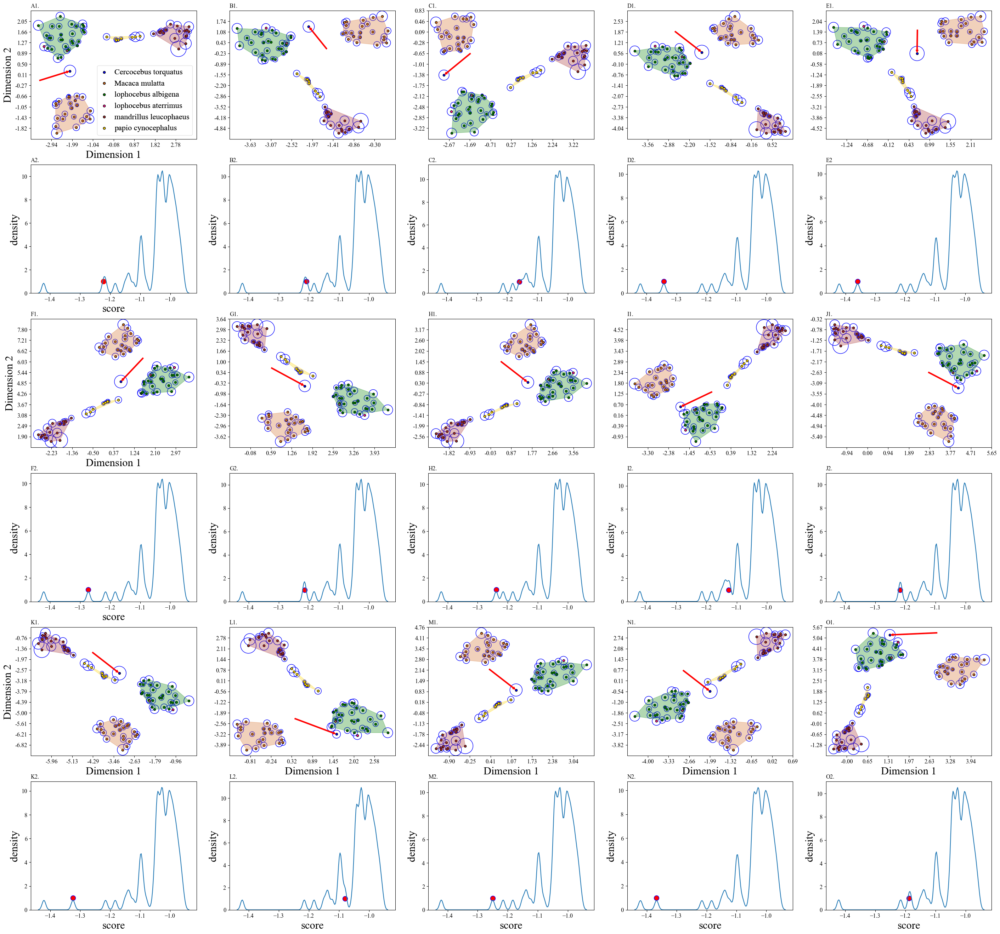

In [40]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

# Data preparation for each prpca instance
Xs0 = prpca0.GPApt  # Data points for prpca0
y0 = prpca0.y  # Labels for prpca0
Xs1 = prpca1.GPApt  # Data points for prpca1
y1 = prpca1.y  # Labels for prpca1
Xs2 = prpca2.GPApt  # Data points for prpca2
y2 = prpca2.y  # Labels for prpca2
Xs3 = prpca3.GPApt  # Data points for prpca3
y3 = prpca3.y  # Labels for prpca3
Xs4 = prpca4.GPApt  # Data points for prpca4
y4 = prpca4.y  # Labels for prpca4
Xs5 = prpca5.GPApt  # Data points for prpca5
y5 = prpca5.y  # Labels for prpca5
Xs6 = prpca6.GPApt  # Data points for prpca6
y6 = prpca6.y  # Labels for prpca6
Xs7 = prpca7.GPApt  # Data points for prpca7
y7 = prpca7.y  # Labels for prpca7
Xs8 = prpca8.GPApt  # Data points for prpca8
y8 = prpca8.y  # Labels for prpca8
Xs9 = prpca9.GPApt  # Data points for prpca9
y9 = prpca9.y  # Labels for prpca9
Xs10 = prpca10.GPApt  # Data points for prpca10
y10 = prpca10.y  # Labels for prpca10
Xs11 = prpca11.GPApt  # Data points for prpca11
y11 = prpca11.y  # Labels for prpca11
Xs12 = prpca12.GPApt  # Data points for prpca12
y12 = prpca12.y  # Labels for prpca12
Xs13 = prpca13.GPApt  # Data points for prpca13
y13 = prpca13.y  # Labels for prpca13
Xs14 = prpca14.GPApt  # Data points for prpca14
y14 = prpca14.y  # Labels for prpca14

# Importing LocalOutlierFactor model from sklearn
from sklearn.neighbors import LocalOutlierFactor

# Initialize the LOF model with specific parameters
model = LocalOutlierFactor(n_neighbors=5, contamination='auto')

# Fitting LOF model and getting predictions and scores for each dataset
y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.negative_outlier_factor_
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.negative_outlier_factor_
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.negative_outlier_factor_
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.negative_outlier_factor_
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.negative_outlier_factor_
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.negative_outlier_factor_
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.negative_outlier_factor_
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.negative_outlier_factor_
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.negative_outlier_factor_
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.negative_outlier_factor_
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.negative_outlier_factor_
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.negative_outlier_factor_
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.negative_outlier_factor_
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.negative_outlier_factor_
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.negative_outlier_factor_

# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'lof', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'lof', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 170)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
fig_axes[0,1].set(xlabel=None)
fig_axes[0,1].set(ylabel=None)
prpca2.plot_tsne(method = 'lof', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -120)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
fig_axes[0,2].set(xlabel=None)
fig_axes[0,2].set(ylabel=None)
prpca3.plot_tsne(method = 'lof', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
fig_axes[0,3].set(xlabel=None)
fig_axes[0,3].set(ylabel=None)
prpca4.plot_tsne(method = 'lof', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -30)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
fig_axes[0,4].set(xlabel=None)
fig_axes[0,4].set(ylabel=None)
prpca5.plot_tsne(method = 'lof', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'lof', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
fig_axes[2,1].set(xlabel=None)
fig_axes[2,1].set(ylabel=None)
prpca7.plot_tsne(method = 'lof', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
fig_axes[2,2].set(xlabel=None)
fig_axes[2,2].set(ylabel=None)
prpca8.plot_tsne(method = 'lof', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -110)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
fig_axes[2,3].set(xlabel=None)
fig_axes[2,3].set(ylabel=None)
prpca9.plot_tsne(method = 'lof', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
fig_axes[2,4].set(xlabel=None)
fig_axes[2,4].set(ylabel=None)
prpca10.plot_tsne(method = 'lof', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'lof', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 20)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
#fig_axes[4,1].set(xlabel=None)
fig_axes[4,1].set(ylabel=None)
prpca12.plot_tsne(method = 'lof', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
#fig_axes[4,2].set(xlabel=None)
fig_axes[4,2].set(ylabel=None)
prpca13.plot_tsne(method = 'lof', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
#fig_axes[4,3].set(xlabel=None)
fig_axes[4,3].set(ylabel=None)
prpca14.plot_tsne(method = 'lof', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -120)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')
3#fig_axes[4,4].set(xlabel=None)
fig_axes[4,4].set(ylabel=None)

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 1, c='r', s=100)
fig_axes[1,0].set_xlabel('score', fontsize = 22)
fig_axes[1,0].set_ylabel('density', fontsize = 22)
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
fig_axes[1,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,1].set_xlabel('score', fontsize = 22)
fig_axes[1,1].set_ylabel('density', fontsize = 22)
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
fig_axes[1,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,2].set_xlabel('score', fontsize = 22)
fig_axes[1,2].set_ylabel('density', fontsize = 22)
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
fig_axes[1,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,3].set_xlabel('score', fontsize = 22)
fig_axes[1,3].set_ylabel('density', fontsize = 22)
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
fig_axes[1,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,4].set_xlabel('score', fontsize = 22)
fig_axes[1,4].set_ylabel('density', fontsize = 22)
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
fig_axes[1,4].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[3,0].set_xlabel('score', fontsize = 22)
fig_axes[3,0].set_ylabel('density', fontsize = 22)
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
fig_axes[3,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,1].set_xlabel('score', fontsize = 22)
fig_axes[3,1].set_ylabel('density', fontsize = 22)
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
fig_axes[3,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,2].set_xlabel('score', fontsize = 22)
fig_axes[3,2].set_ylabel('density', fontsize = 22)
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
fig_axes[3,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,3].set_xlabel('score', fontsize = 22)
fig_axes[3,3].set_ylabel('density', fontsize = 22)
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
fig_axes[3,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,4].set_xlabel('score', fontsize = 22)
fig_axes[3,4].set_ylabel('density', fontsize = 22)
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
fig_axes[3,4].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,0].set_xlabel('score', fontsize = 22)
fig_axes[5,0].set_ylabel('density', fontsize = 22)
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
fig_axes[5,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,1].set_xlabel('score', fontsize = 22)
fig_axes[5,1].set_ylabel('density', fontsize = 22)
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
fig_axes[5,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,2].set_xlabel('score', fontsize = 22)
fig_axes[5,2].set_ylabel('density', fontsize = 22)
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
fig_axes[5,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,3].set_xlabel('score', fontsize = 22)
fig_axes[5,3].set_ylabel('density', fontsize = 22)
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
fig_axes[5,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,4].set_xlabel('score', fontsize = 22)
fig_axes[5,4].set_ylabel('density', fontsize = 22)
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')
fig_axes[5,4].tick_params(axis='both', which='major', labelsize=12)


plt.savefig('Cercocebus_torquatus.svg', transparent = False)
plt.show()

# Novelty Detection Isolation Forest

c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the ed

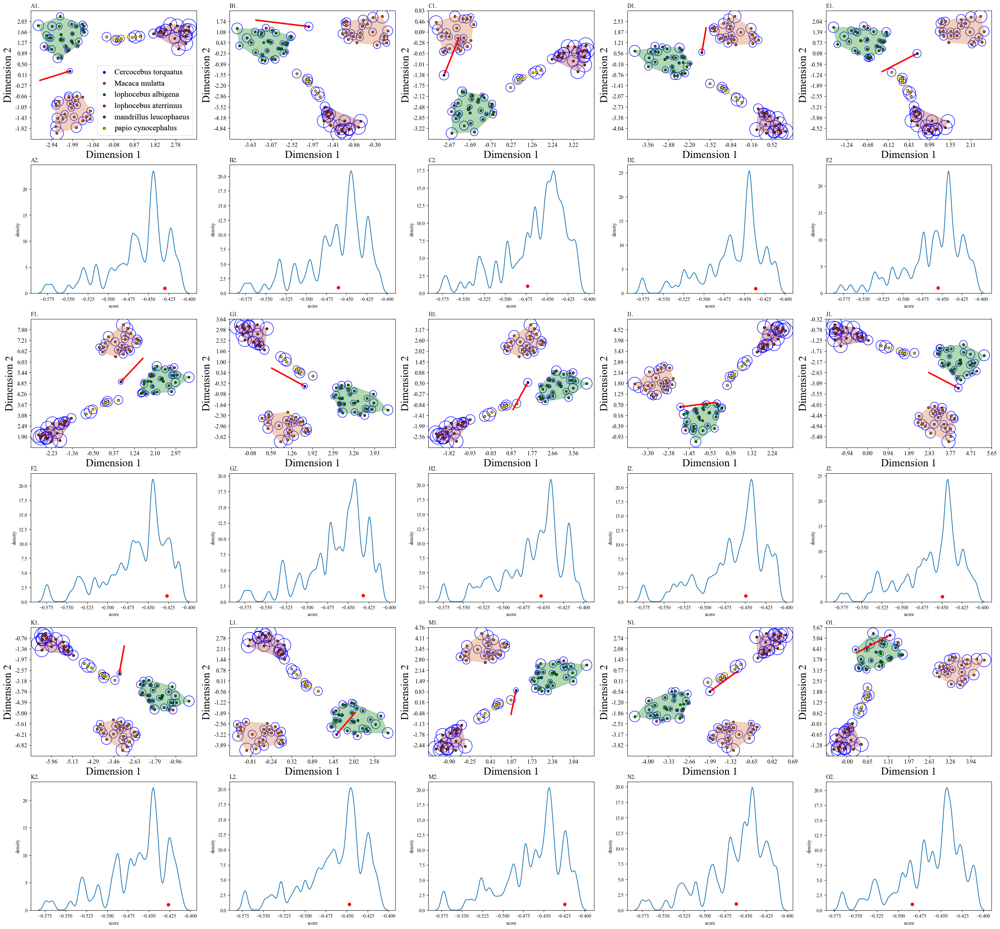

In [41]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

Xs0 = prpca0.GPApt
y0 = prpca0.y
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y
Xs4 = prpca4.GPApt
y4 = prpca4.y
Xs5 = prpca5.GPApt
y5 = prpca5.y
Xs6 = prpca6.GPApt
y6 = prpca6.y
Xs7 = prpca7.GPApt
y7 = prpca7.y
Xs8 = prpca8.GPApt
y8 = prpca8.y
Xs9 = prpca9.GPApt
y9 = prpca9.y
Xs10 = prpca10.GPApt
y10 = prpca10.y
Xs11 = prpca11.GPApt
y11 = prpca11.y
Xs12 = prpca12.GPApt
y12 = prpca12.y
Xs13 = prpca13.GPApt
y13 = prpca13.y
Xs14 = prpca14.GPApt
y14 = prpca14.y

from sklearn.ensemble import IsolationForest
model = IsolationForest(random_state=0)

y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.score_samples(Xs0)
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.score_samples(Xs1)
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.score_samples(Xs2)
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.score_samples(Xs3)
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.score_samples(Xs4)
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.score_samples(Xs5)
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.score_samples(Xs6)
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.score_samples(Xs7)
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.score_samples(Xs8)
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.score_samples(Xs9)
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.score_samples(Xs10)
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.score_samples(Xs11)
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.score_samples(Xs12)
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.score_samples(Xs13)
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.score_samples(Xs14)

# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'if', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'if', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
prpca2.plot_tsne(method = 'if', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -90)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
prpca3.plot_tsne(method = 'if', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -40)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
prpca4.plot_tsne(method = 'if', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
prpca5.plot_tsne(method = 'if', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'if', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
prpca7.plot_tsne(method = 'if', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
prpca8.plot_tsne(method = 'if', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -130)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
prpca9.plot_tsne(method = 'if', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
prpca10.plot_tsne(method = 'if', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'if', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
prpca12.plot_tsne(method = 'if', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 140)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
prpca13.plot_tsne(method = 'if', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -70)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
prpca14.plot_tsne(method = 'if', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 100)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 1, c='r')
fig_axes[1,0].set_xlabel('score')
fig_axes[1,0].set_ylabel('density')
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 1, c='r')
fig_axes[1,1].set_xlabel('score')
fig_axes[1,1].set_ylabel('density')
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 1, c='r')
fig_axes[1,2].set_xlabel('score')
fig_axes[1,2].set_ylabel('density')
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 1, c='r')
fig_axes[1,3].set_xlabel('score')
fig_axes[1,3].set_ylabel('density')
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 1, c='r')
fig_axes[1,4].set_xlabel('score')
fig_axes[1,4].set_ylabel('density')
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 1, c='r')
fig_axes[3,0].set_xlabel('score')
fig_axes[3,0].set_ylabel('density')
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 1, c='r')
fig_axes[3,1].set_xlabel('score')
fig_axes[3,1].set_ylabel('density')
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 1, c='r')
fig_axes[3,2].set_xlabel('score')
fig_axes[3,2].set_ylabel('density')
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 1, c='r')
fig_axes[3,3].set_xlabel('score')
fig_axes[3,3].set_ylabel('density')
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 1, c='r')
fig_axes[3,4].set_xlabel('score')
fig_axes[3,4].set_ylabel('density')
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 1, c='r')
fig_axes[5,0].set_xlabel('score')
fig_axes[5,0].set_ylabel('density')
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 1, c='r')
fig_axes[5,1].set_xlabel('score')
fig_axes[5,1].set_ylabel('density')
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 1, c='r')
fig_axes[5,2].set_xlabel('score')
fig_axes[5,2].set_ylabel('density')
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 1, c='r')
fig_axes[5,3].set_xlabel('score')
fig_axes[5,3].set_ylabel('density')
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 1, c='r')
fig_axes[5,4].set_xlabel('score')
fig_axes[5,4].set_ylabel('density')
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')


plt.savefig('Cercocebus_torquatus_IF.svg', transparent = True)
plt.show()

# Novelty Detection One Class SVM

c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\MORPHIX codes\Morphometrics_3.py:795: UserWarning: Setting the 'color' property will override the ed

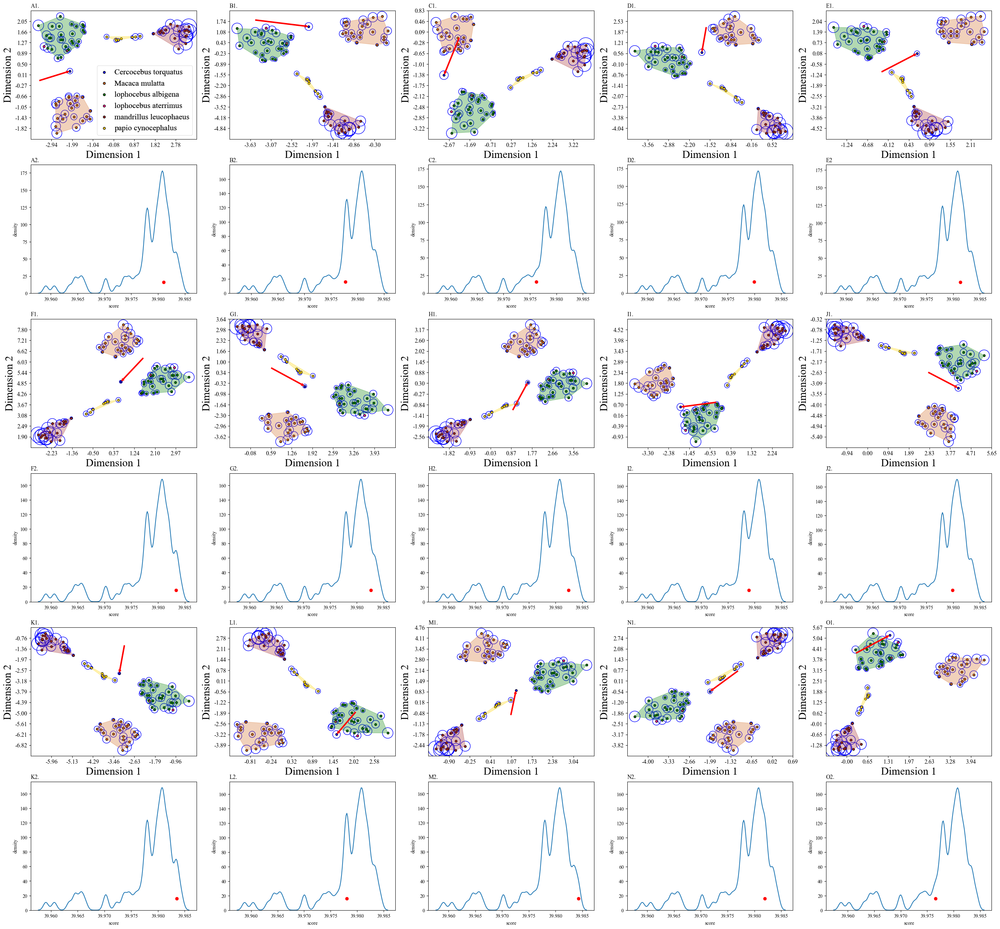

In [42]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

Xs0 = prpca0.GPApt
y0 = prpca0.y
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y
Xs4 = prpca4.GPApt
y4 = prpca4.y
Xs5 = prpca5.GPApt
y5 = prpca5.y
Xs6 = prpca6.GPApt
y6 = prpca6.y
Xs7 = prpca7.GPApt
y7 = prpca7.y
Xs8 = prpca8.GPApt
y8 = prpca8.y
Xs9 = prpca9.GPApt
y9 = prpca9.y
Xs10 = prpca10.GPApt
y10 = prpca10.y
Xs11 = prpca11.GPApt
y11 = prpca11.y
Xs12 = prpca12.GPApt
y12 = prpca12.y
Xs13 = prpca13.GPApt
y13 = prpca13.y
Xs14 = prpca14.GPApt
y14 = prpca14.y

from sklearn.svm import OneClassSVM
model = OneClassSVM(gamma='auto')

y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.score_samples(Xs0)
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.score_samples(Xs1)
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.score_samples(Xs2)
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.score_samples(Xs3)
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.score_samples(Xs4)
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.score_samples(Xs5)
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.score_samples(Xs6)
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.score_samples(Xs7)
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.score_samples(Xs8)
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.score_samples(Xs9)
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.score_samples(Xs10)
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.score_samples(Xs11)
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.score_samples(Xs12)
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.score_samples(Xs13)
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.score_samples(Xs14)

# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'ocsvm', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'ocsvm', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
prpca2.plot_tsne(method = 'ocsvm', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -90)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
prpca3.plot_tsne(method = 'ocsvm', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -40)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
prpca4.plot_tsne(method = 'ocsvm', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
prpca5.plot_tsne(method = 'ocsvm', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'ocsvm', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
prpca7.plot_tsne(method = 'ocsvm', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
prpca8.plot_tsne(method = 'ocsvm', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -130)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
prpca9.plot_tsne(method = 'ocsvm', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
prpca10.plot_tsne(method = 'ocsvm', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'ocsvm', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
prpca12.plot_tsne(method = 'ocsvm', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 140)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
prpca13.plot_tsne(method = 'ocsvm', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -70)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
prpca14.plot_tsne(method = 'ocsvm', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 100)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 16, c='r')
fig_axes[1,0].set_xlabel('score')
fig_axes[1,0].set_ylabel('density')
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 16, c='r')
fig_axes[1,1].set_xlabel('score')
fig_axes[1,1].set_ylabel('density')
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 16, c='r')
fig_axes[1,2].set_xlabel('score')
fig_axes[1,2].set_ylabel('density')
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 16, c='r')
fig_axes[1,3].set_xlabel('score')
fig_axes[1,3].set_ylabel('density')
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 16, c='r')
fig_axes[1,4].set_xlabel('score')
fig_axes[1,4].set_ylabel('density')
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 16, c='r')
fig_axes[3,0].set_xlabel('score')
fig_axes[3,0].set_ylabel('density')
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 16, c='r')
fig_axes[3,1].set_xlabel('score')
fig_axes[3,1].set_ylabel('density')
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 16, c='r')
fig_axes[3,2].set_xlabel('score')
fig_axes[3,2].set_ylabel('density')
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 16, c='r')
fig_axes[3,3].set_xlabel('score')
fig_axes[3,3].set_ylabel('density')
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 16, c='r')
fig_axes[3,4].set_xlabel('score')
fig_axes[3,4].set_ylabel('density')
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 16, c='r')
fig_axes[5,0].set_xlabel('score')
fig_axes[5,0].set_ylabel('density')
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 16, c='r')
fig_axes[5,1].set_xlabel('score')
fig_axes[5,1].set_ylabel('density')
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 16, c='r')
fig_axes[5,2].set_xlabel('score')
fig_axes[5,2].set_ylabel('density')
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 16, c='r')
fig_axes[5,3].set_xlabel('score')
fig_axes[5,3].set_ylabel('density')
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 16, c='r')
fig_axes[5,4].set_xlabel('score')
fig_axes[5,4].set_ylabel('density')
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')


plt.savefig('Cercocebus_torquatus_OCSVM.svg', transparent = True)
plt.show()